# Face Generation

In this project, you'll define and train a Generative Adverserial network of your own creation on a dataset of faces. Your goal is to get a generator network to generate *new* images of faces that look as realistic as possible!

The project will be broken down into a series of tasks from **defining new architectures training adversarial networks**. At the end of the notebook, you'll be able to visualize the results of your trained Generator to see how it performs; your generated samples should look like fairly realistic faces with small amounts of noise.

### Get the Data

You'll be using the [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) to train your adversarial networks.

This dataset has higher resolution images than datasets you have previously worked with (like MNIST or SVHN) you've been working with, and so, you should prepare to define deeper networks and train them for a longer time to get good results. It is suggested that you utilize a GPU for training.

### Pre-processed Data

Since the project's main focus is on building the GANs, we've done *some* of the pre-processing for you. Each of the CelebA images has been cropped to remove parts of the image that don't include a face, then resized down to 64x64x3 NumPy images. Some sample data is show below.

<img src='assets/processed_face_data.png' width=60% />

> If you are working locally, you can download this data [by clicking here](https://s3.amazonaws.com/video.udacity-data.com/topher/2018/November/5be7eb6f_processed-celeba-small/processed-celeba-small.zip)

This is a zip file that you'll need to extract in the home directory of this notebook for further loading and processing. After extracting the data, you should be left with a directory of data `processed-celeba-small/`.

In [ ]:
# run this once to unzip the file
!unzip processed-celeba-small.zip

In [1]:
import os
import glob
from glob import glob
from typing import Tuple, Callable, Dict

import matplotlib.pyplot as plt
import numpy as np
import torch
from PIL import Image
from torch.utils.data import DataLoader, Dataset
from torchvision.transforms import Compose, ToTensor

import tests

In [2]:
data_dir = 'processed_celeba_small/celeba/'

## Data pipeline

The [CelebA](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations. Since you're going to be generating faces, you won't need the annotations, you'll only need the images. Note that these are color images with [3 color channels (RGB)](https://en.wikipedia.org/wiki/Channel_(digital_image)#RGB_Images) each.

### Pre-process and Load the Data

Since the project's main focus is on building the GANs, we've done *some* of the pre-processing for you. Each of the CelebA images has been cropped to remove parts of the image that don't include a face, then resized down to 64x64x3 NumPy images. This *pre-processed* dataset is a smaller subset of the very large CelebA dataset and contains roughly 30,000 images. 

Your first task consists in building the dataloader. To do so, you need to do the following:
* implement the get_transforms function
* create a custom Dataset class that reads the CelebA data

### Exercise: implement the get_transforms function

The `get_transforms` function should output a [`torchvision.transforms.Compose`](https://pytorch.org/vision/stable/generated/torchvision.transforms.Compose.html#torchvision.transforms.Compose) of different transformations. You have two constraints:
* the function takes a tuple of size as input and should **resize the images** to the input size
* the output images should have values **ranging from -1 to 1**

In [3]:
from torchvision.transforms import Resize, ToTensor, Normalize

def get_transforms(size: Tuple[int, int]) -> Callable:
    """ Transforms to apply to the image."""
    # TODO: edit this function by appending transforms to the below list
    transforms = [Resize(size), ToTensor(), Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])]
    
    return Compose(transforms)

### Exercise: implement the DatasetDirectory class


The `DatasetDirectory` class is a torch Dataset that reads from the above data directory. The `__getitem__` method should output a transformed tensor and the `__len__` method should output the number of files in our dataset. You can look at [this custom dataset](https://pytorch.org/tutorials/beginner/basics/data_tutorial.html#creating-a-custom-dataset-for-your-files) for ideas. 

In [4]:
import glob
from PIL import Image

class DatasetDirectory(Dataset):
    """
    A custom dataset class that loads images from folder.
    args:
    - directory: location of the images
    - transform: transform function to apply to the images
    - extension: file format
    """
    def __init__(self, 
                 directory: str, 
                 transforms: Callable = None, 
                 extension: str = '.jpg'):
        # TODO: implement the init method
        self.img_dir = directory
        self.transform = transforms
        self.extension = extension
        self.indx = []
        ext_files = glob.glob(os.path.join(self.img_dir, f"*{self.extension}"))
        for item in ext_files:
            self.indx.append(item)

    def __len__(self) -> int:
        """ returns the number of items in the dataset """
        # TODO: return the number of elements in the dataset
#        print(f"Number of JPG files: {len(self.indx)}")
        return (len(self.indx))

    def __getitem__(self, index: int) -> torch.Tensor:
        """ load an image and apply transformation """
        # TODO: return the index-element of the dataset
#        print(f"Path to JPG files: {self.indx[index]}")
        image = Image.open(self.indx[index])
        image = self.transform(image)
#       print(f'Image min: {image.min()}, Image max: {image.max()}')
        return image
         

In [5]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""
# run this cell to verify your dataset implementation
dataset = DatasetDirectory(data_dir, get_transforms((64, 64)))
tests.check_dataset_outputs(dataset)

Congrats, your dataset implementation passed all the tests


The functions below will help you visualize images from the dataset.

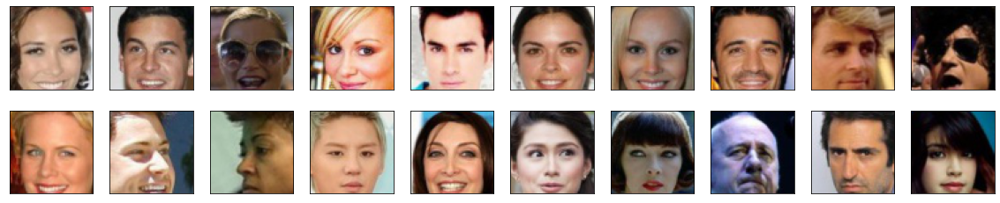

In [6]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""

def denormalize(images):
    """Transform images from [-1.0, 1.0] to [0, 255] and cast them to uint8."""
    return ((images + 1.) / 2. * 255).astype(np.uint8)

# plot the images in the batch, along with the corresponding labels
fig = plt.figure(figsize=(20, 4))
plot_size=20
for idx in np.arange(plot_size):
    ax = fig.add_subplot(2, int(plot_size/2), idx+1, xticks=[], yticks=[])
    img = dataset[idx].numpy()
    img = np.transpose(img, (1, 2, 0))
    img = denormalize(img)
    ax.imshow(img)

## Model implementation

As you know, a GAN is comprised of two adversarial networks, a discriminator and a generator. Now that we have a working data pipeline, we need to implement the discriminator and the generator. 

Feel free to implement any additional class or function.

### Exercise: Create the discriminator

The discriminator's job is to score real and fake images. You have two constraints here:
* the discriminator takes as input a **batch of 64x64x3 images**
* the output should be a single value (=score)

Feel free to get inspiration from the different architectures we talked about in the course, such as DCGAN, WGAN-GP or DRAGAN.

#### Some tips
* To scale down from the input image, you can either use `Conv2d` layers with the correct hyperparameters or Pooling layers.
* If you plan on using gradient penalty, do not use Batch Normalization layers in the discriminator.

In [7]:
from torch.nn import Module
import torch.nn as nn

In [8]:
lu_tuner = 0.2    #prev 0.1 , 0.2

class ConvBlock(Module):
    """
    A convolutional block for GP gradient penalty made of 2 layers: Conv -> Activation.
    args:
    - in_channels: number of channels in the input to the conv layer
    - out_channels: number of filters in the conv layer
    - kernel_size: filter dimension of the conv layer
    """
    def __init__(self, in_channels: int, out_channels: int, kernel_size: int):
        super(ConvBlock, self).__init__()
        self.conv = nn.Conv2d(in_channels, out_channels, kernel_size, stride=2, padding=1, bias=False)
        self.activation = nn.LeakyReLU(lu_tuner)
        
    def forward(self, x: torch.Tensor) -> torch.Tensor:
        x = self.conv(x)
        x = self.activation(x)
        return x

In [9]:
class Discriminator(Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        # TODO: instantiate the different layers
        # complete init function
        conv_dim = 64   ##keep this at 64 otherwise takes a long time to do tuning
        self.conv1 = ConvBlock(3, conv_dim, 4) #32x32 out
        self.conv2 = ConvBlock(conv_dim, conv_dim*2, 4)  #16 out
        self.conv3 = ConvBlock(conv_dim*2, conv_dim*4, 4) #8 out
        self.conv4 = ConvBlock(conv_dim*4, conv_dim*8, 4) #4 out        
        self.flatten = nn.Flatten()
        self.fc = nn.Linear(conv_dim*4*4*4*2, 1)
        
    def forward(self, x: torch.Tensor) -> torch.Tensor:
        # TODO: implement the forward method
        # all hidden layers + leaky relu activation
        x = self.conv1(x)
        x = self.conv2(x)
        x = self.conv3(x)
        x = self.conv4(x)
        # flatten
        x = self.flatten(x)
        # final output layer
        x = self.fc(x) 
        x = x.unsqueeze(2).unsqueeze(3)
        return x


In [10]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""
# run this cell to check your discriminator implementation
discriminator = Discriminator()
tests.check_discriminator(discriminator)

Congrats, your discriminator implementation passed all the tests


### Exercise: create the generator

The generator's job creates the "fake images" and learns the dataset distribution. You have three constraints here:
* the generator takes as input a vector of dimension `[batch_size, latent_dimension, 1, 1]`
* the generator must outputs **64x64x3 images**

Feel free to get inspiration from the different architectures we talked about in the course, such as DCGAN, WGAN-GP or DRAGAN.

#### Some tips:
* to scale up from the latent vector input, you can use `ConvTranspose2d` layers
* as often with Gan, **Batch Normalization** helps with training

In [11]:
class DeconvBlock(nn.Module):
    """
    A "de-convolutional" block is made of 3 layers: ConvTranspose -> BatchNorm -> Activation.
    args:
    - in_channels: number of channels in the input to the conv layer
    - out_channels: number of filters in the conv layer
    - kernel_size: filter dimension of the conv layer
    - stride: stride of the conv layer
    - padding: padding of the conv layer
    """
    def __init__(self, 
                 in_channels: int, 
                 out_channels: int, 
                 kernel_size: int, 
                 stride: int,
                 padding: int):  
        super(DeconvBlock, self).__init__()
        self.deconv = nn.ConvTranspose2d(in_channels, out_channels, kernel_size, stride, padding, bias=False)
        self.activation = nn.ReLU()
        
    def forward(self, x: torch.Tensor) -> torch.Tensor:
        x = self.deconv(x)
        x = self.activation(x)
        return x


In [12]:
class Generator(Module):
    def __init__(self, latent_dim: int):
        super(Generator, self).__init__()
        # TODO: instantiate the different layers
        conv_dim = 64
        self.deconv0 = DeconvBlock(latent_dim, conv_dim*8, 4, 1, 0)
        self.deconv1 = DeconvBlock(conv_dim*8, conv_dim*4, 4, 2, 1)
        self.deconv2 = DeconvBlock(conv_dim*4, conv_dim*2, 4, 2, 1)
        self.deconv3 = DeconvBlock(conv_dim*2, conv_dim  , 4, 2, 1)
        self.deconv4 = nn.ConvTranspose2d(conv_dim, 3, 4, stride=2, padding=1)
        self.last_activation = nn.Tanh()

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        # TODO: implement the forward method
        x = self.deconv0(x)
        x = self.deconv1(x)
        x = self.deconv2(x)
        x = self.deconv3(x)
        x = self.deconv4(x)
        x = self.last_activation(x)
        return x

In [13]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""
# run this cell to verify your generator implementation
latent_dim = 128
generator = Generator(latent_dim)
tests.check_generator(generator, latent_dim)

Congrats, your generator implementation passed all the tests


## Optimizer

In the following section, we create the optimizers for the generator and discriminator. You may want to experiment with different optimizers, learning rates and other hyperparameters as they tend to impact the output quality.

### Exercise: implement the optimizers

In [14]:
import torch.optim as optim

# params
rms_lr = 0.000025

#from https://machinelearningmastery.com/how-to-implement-wasserstein-loss-for-generative-adversarial-networks/
# Use the RMSProp version of gradient descent with small learning rate and no momentum (e.g. 0.00005).
# regular DCGAN
def create_optimizzers(generator: Module, discriminator: Module):
    lr = 0.0002
    beta1=0.5
    beta2=0.999 # default value
    g_optimizer = optim.Adam(generator.parameters(), lr, [beta1, beta2])
    d_optimizer = optim.Adam(discriminator.parameters(), lr, [beta1, beta2])
    return g_optimizer, d_optimizer

def create_optimizers(generator: Module, discriminator: Module):
    """ This function should return the optimizers of the generator and the discriminator """
    # TODO: implement the generator and discriminator optimizers
    rms_lr = 0.00005
    g_optimizer = optim.RMSprop(generator.parameters(), rms_lr)
    d_optimizer = optim.RMSprop(discriminator.parameters(), rms_lr)
    return g_optimizer, d_optimizer

## Losses implementation

In this section, we are going to implement the loss function for the generator and the discriminator. You can and should experiment with different loss function.

Some tips:
* You can choose the commonly used the binary cross entropy loss or select other losses we have discovered in the course, such as the Wasserstein distance.
* You may want to implement a gradient penalty function as discussed in the course. It is not required and the code will work whether you implement it or not.

### Exercise: implement the generator loss

The generator's goal is to get the discriminator to think its generated images (= "fake" images) are real.

In [15]:
def generator_loss(fake_logits):
    """ Generator loss, takes the fake scores as inputs. 
    Wasserstein Generator Loss
    
    args:
    - fake_logits: vector of logits outputed by the discriminator with a fake input image 
    """
    fake_loss = -fake_logits.mean()
    return fake_loss


### Exercise: implement the discriminator loss

We want the discriminator to give high scores to real images and low scores to fake ones and the discriminator loss should reflect that.

In [16]:
def discriminator_loss(real_logits, fake_logits):
    """ Discriminator loss, takes the fake and real logits as inputs.
        Wasserstein Discriminator Loss
    args:
    - real_logits: vector of logits outputed by the discriminator with a real input image
    - fake_logits: vector of logits outputed by the discriminator with a fake input image 
    """
    real_loss = -real_logits.mean()
    fake_loss = fake_logits.mean()
    return real_loss + fake_loss


### Exercise (Optional): Implement the gradient Penalty

In the course, we discussed the importance of gradient penalty in training certain types of Gans. Implementing this function is not required and depends on some of the design decision you made (discriminator architecture, loss functions).

In [17]:
def gradient_penalty(discriminator, real_samples, fake_samples):
    """
    Gradient penalty of the WGAN-GP model
    args:
    - real_sample: sample from the real dataset
    - fake_sample: generated sample
    
    returns:
    - gradient penalty
    """
    # sample a random point between both distributions
    alpha = torch.rand(real_samples.shape).to(device)
    x_hat = (alpha*real_samples + (1 - alpha)*fake_samples).requires_grad_(True)
    
    # calculate the gradient
    pred = discriminator(x_hat)
    grad = torch.autograd.grad(pred, x_hat , 
                               grad_outputs=torch.ones_like(pred), 
                               create_graph=True)[0]
    
    # calculate the norm and the final penalty
    norm = torch.norm(grad.view(-1), 2)
    gp = ((norm - 1)**2).mean()    
    
    return gp

## Training


Training will involve alternating between training the discriminator and the generator. You'll use your functions real_loss and fake_loss to help you calculate the discriminator losses.

* You should train the discriminator by alternating on real and fake images
* Then the generator, which tries to trick the discriminator and should have an opposing loss function

### Exercise: implement the generator step and the discriminator step functions

Each function should do the following:
* calculate the loss
* backpropagate the gradient
* perform one optimizer step

In [18]:

def generator_step(batch_size: int, latent_dim: int) -> Dict:
    """ One training step of the generator. """
    # TODO: implement the generator step (foward pass, loss calculation and backward pass)
    g_optimizer.zero_grad()      
    noise = torch.randn(batch_size, latent_dim, 1, 1).float().to(device)
    fake_images = generator(noise)
    D_fake = discriminator(fake_images)
    g_loss = generator_loss(D_fake) # use real loss to flip labels
    g_loss.backward()
    g_optimizer.step()    
    return {'loss': g_loss}

def discriminator_step(batch_size: int, latent_dim: int, real_images: torch.Tensor) -> Dict:
    """ One training step of the discriminator. """
    # TODO: implement the discriminator step (foward pass, loss calculation and backward pass)
    lambda_val = 7   #21 was small diversity , 10 seemed no btter than  5

    d_optimizer.zero_grad()        
    D_real = discriminator(real_images)        
    noise = torch.randn(batch_size, latent_dim, 1, 1).float().to(device)
    fake_images = generator(noise) 
    D_fake = discriminator(fake_images.detach())
    d_loss = discriminator_loss(D_real, D_fake)        
    gp = gradient_penalty(discriminator, real_images, fake_images)
    d_loss = d_loss + gp*lambda_val
    d_loss.backward()
    d_optimizer.step()
    
    return {'loss': d_loss, 'gp': gp}

### Main training loop

You don't have to implement anything here but you can experiment with different hyperparameters.

In [19]:
from datetime import datetime

In [20]:
# you can experiment with different dimensions of latent spaces
latent_dim = 128

# update to cpu if you do not have access to a gpu
if torch.cuda.is_available():
    device = torch.device('cuda')
else:
    device = torch.device('cpu')
    
# number of epochs to train your model
n_epochs = 40

# number of images in each batch
batch_size = 128   #prev 64

In [21]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""
print_every = 50

# Create optimizers for the discriminator D and generator G
generator = Generator(latent_dim).to(device)
discriminator = Discriminator().to(device)
g_optimizer, d_optimizer = create_optimizers(generator, discriminator)

dataloader = DataLoader(dataset, 
                        batch_size, 
                        shuffle=True, 
                        num_workers=4, 
                        drop_last=True,
                        pin_memory=False)

In [22]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""

def display(fixed_latent_vector: torch.Tensor):
    """ helper function to display images during training """
    fig = plt.figure(figsize=(14, 4))
    plot_size = 16
    for idx in np.arange(plot_size):
        ax = fig.add_subplot(2, int(plot_size/2), idx+1, xticks=[], yticks=[])
        img = fixed_latent_vector[idx, ...].detach().cpu().numpy()
        img = np.transpose(img, (1, 2, 0))
        img = denormalize(img)
        ax.imshow(img)
    plt.show()

### Exercise: implement the training strategy

You should experiment with different training strategies. For example:

* train the generator more often than the discriminator. 
* added noise to the input image
* use label smoothing

Implement with your training strategy below.

2023-12-05 04:17:04 | Ep [1/40] | Bch 0/254 | d_lss: 4.8737 | g_lss: 0.0092
2023-12-05 04:17:23 | Ep [1/40] | Bch 50/254 | d_lss: -3.4245 | g_lss: 0.5444
2023-12-05 04:17:45 | Ep [1/40] | Bch 100/254 | d_lss: -4.1523 | g_lss: 0.0664
2023-12-05 04:18:06 | Ep [1/40] | Bch 150/254 | d_lss: -3.0749 | g_lss: 0.2354
2023-12-05 04:18:27 | Ep [1/40] | Bch 200/254 | d_lss: -2.0058 | g_lss: -0.0958
2023-12-05 04:18:48 | Ep [1/40] | Bch 250/254 | d_lss: -2.1298 | g_lss: -0.4665


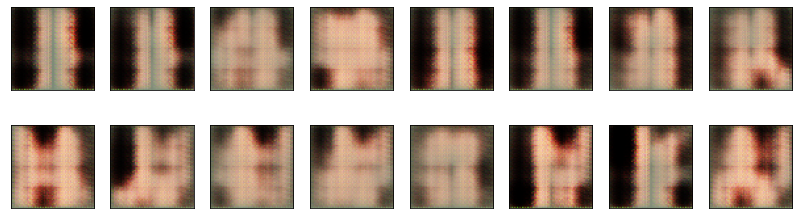

2023-12-05 04:18:54 | Ep [2/40] | Bch 0/254 | d_lss: -2.2977 | g_lss: -0.1658
2023-12-05 04:19:13 | Ep [2/40] | Bch 50/254 | d_lss: -2.2065 | g_lss: 0.1428
2023-12-05 04:19:31 | Ep [2/40] | Bch 100/254 | d_lss: -2.2583 | g_lss: 0.8100
2023-12-05 04:19:52 | Ep [2/40] | Bch 150/254 | d_lss: -1.9939 | g_lss: -0.3039
2023-12-05 04:20:13 | Ep [2/40] | Bch 200/254 | d_lss: -2.2697 | g_lss: -0.0846
2023-12-05 04:20:34 | Ep [2/40] | Bch 250/254 | d_lss: -1.6446 | g_lss: 1.2114


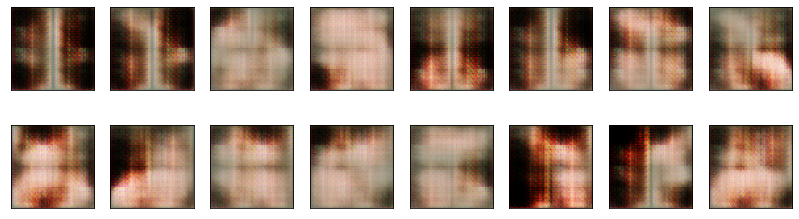

2023-12-05 04:20:40 | Ep [3/40] | Bch 0/254 | d_lss: -2.2392 | g_lss: 0.5597
2023-12-05 04:21:01 | Ep [3/40] | Bch 50/254 | d_lss: -2.1741 | g_lss: -0.7331
2023-12-05 04:21:20 | Ep [3/40] | Bch 100/254 | d_lss: -1.8642 | g_lss: 0.4800
2023-12-05 04:21:38 | Ep [3/40] | Bch 150/254 | d_lss: -1.6164 | g_lss: 0.2485
2023-12-05 04:21:59 | Ep [3/40] | Bch 200/254 | d_lss: -1.4043 | g_lss: 1.5936
2023-12-05 04:22:20 | Ep [3/40] | Bch 250/254 | d_lss: -1.4789 | g_lss: 0.0422


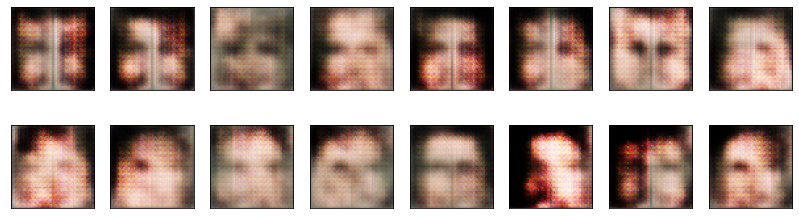

2023-12-05 04:22:25 | Ep [4/40] | Bch 0/254 | d_lss: -1.3843 | g_lss: 0.2089
2023-12-05 04:22:46 | Ep [4/40] | Bch 50/254 | d_lss: -1.3633 | g_lss: 0.0460
2023-12-05 04:23:07 | Ep [4/40] | Bch 100/254 | d_lss: -1.2160 | g_lss: -0.1945
2023-12-05 04:23:27 | Ep [4/40] | Bch 150/254 | d_lss: -1.2259 | g_lss: -0.1266
2023-12-05 04:23:45 | Ep [4/40] | Bch 200/254 | d_lss: -1.1168 | g_lss: -0.0809
2023-12-05 04:24:05 | Ep [4/40] | Bch 250/254 | d_lss: -1.0846 | g_lss: -0.4125


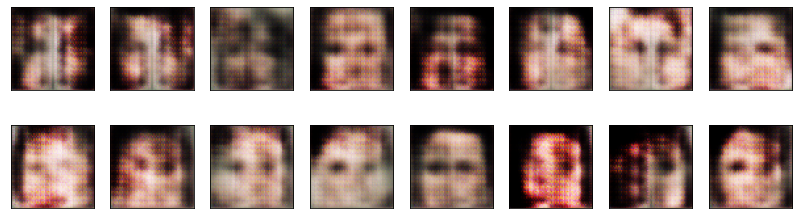

2023-12-05 04:24:11 | Ep [5/40] | Bch 0/254 | d_lss: -1.0870 | g_lss: 0.5191
2023-12-05 04:24:31 | Ep [5/40] | Bch 50/254 | d_lss: -1.2237 | g_lss: -0.2904
2023-12-05 04:24:52 | Ep [5/40] | Bch 100/254 | d_lss: -0.9579 | g_lss: 0.0689
2023-12-05 04:25:14 | Ep [5/40] | Bch 150/254 | d_lss: -0.9803 | g_lss: 0.0092
2023-12-05 04:25:33 | Ep [5/40] | Bch 200/254 | d_lss: -0.7950 | g_lss: 0.6244
2023-12-05 04:25:51 | Ep [5/40] | Bch 250/254 | d_lss: -0.8333 | g_lss: -0.3131


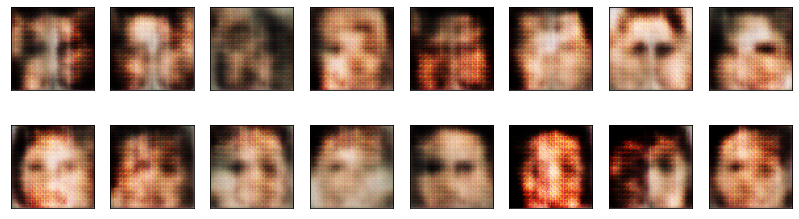

2023-12-05 04:25:55 | Ep [6/40] | Bch 0/254 | d_lss: -0.9501 | g_lss: 0.3045
2023-12-05 04:26:17 | Ep [6/40] | Bch 50/254 | d_lss: -0.4075 | g_lss: -0.3707
2023-12-05 04:26:37 | Ep [6/40] | Bch 100/254 | d_lss: -0.9923 | g_lss: 0.0584
2023-12-05 04:26:58 | Ep [6/40] | Bch 150/254 | d_lss: -0.8023 | g_lss: 0.1187
2023-12-05 04:27:20 | Ep [6/40] | Bch 200/254 | d_lss: -0.9531 | g_lss: -0.2857
2023-12-05 04:27:40 | Ep [6/40] | Bch 250/254 | d_lss: -0.8729 | g_lss: -0.3501


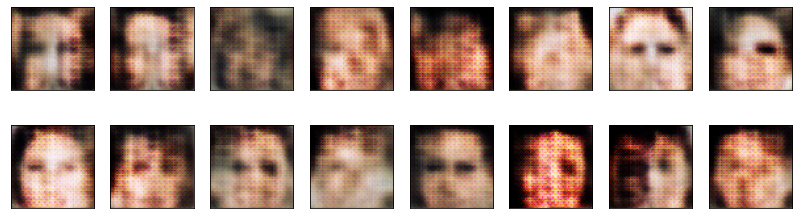

2023-12-05 04:27:44 | Ep [7/40] | Bch 0/254 | d_lss: -0.8427 | g_lss: 0.3519
2023-12-05 04:28:01 | Ep [7/40] | Bch 50/254 | d_lss: -0.8894 | g_lss: 0.0878
2023-12-05 04:28:22 | Ep [7/40] | Bch 100/254 | d_lss: -0.9117 | g_lss: 0.1460
2023-12-05 04:28:43 | Ep [7/40] | Bch 150/254 | d_lss: -0.8958 | g_lss: -0.1244
2023-12-05 04:29:04 | Ep [7/40] | Bch 200/254 | d_lss: -0.7431 | g_lss: 0.6571
2023-12-05 04:29:25 | Ep [7/40] | Bch 250/254 | d_lss: -0.8350 | g_lss: 0.4540


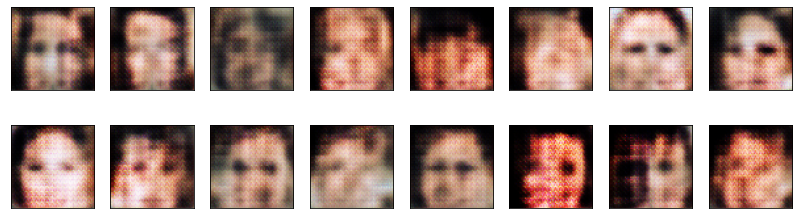

2023-12-05 04:29:31 | Ep [8/40] | Bch 0/254 | d_lss: -0.8963 | g_lss: -0.2305
2023-12-05 04:29:50 | Ep [8/40] | Bch 50/254 | d_lss: -0.7252 | g_lss: 0.3337
2023-12-05 04:30:08 | Ep [8/40] | Bch 100/254 | d_lss: -0.7233 | g_lss: 0.8482
2023-12-05 04:30:28 | Ep [8/40] | Bch 150/254 | d_lss: -0.8543 | g_lss: -0.1083
2023-12-05 04:30:50 | Ep [8/40] | Bch 200/254 | d_lss: -0.7151 | g_lss: -0.1634
2023-12-05 04:31:11 | Ep [8/40] | Bch 250/254 | d_lss: -0.7077 | g_lss: -0.6664


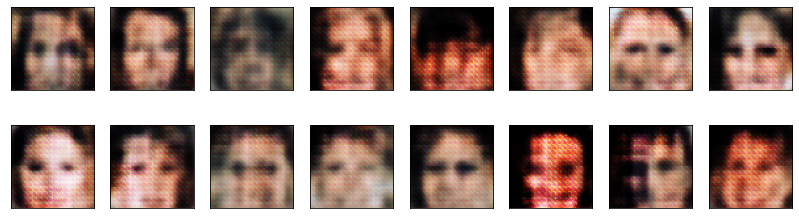

2023-12-05 04:31:17 | Ep [9/40] | Bch 0/254 | d_lss: -0.6935 | g_lss: 0.0183
2023-12-05 04:31:38 | Ep [9/40] | Bch 50/254 | d_lss: -0.7187 | g_lss: 0.2505
2023-12-05 04:31:58 | Ep [9/40] | Bch 100/254 | d_lss: -0.8463 | g_lss: 0.4430
2023-12-05 04:32:16 | Ep [9/40] | Bch 150/254 | d_lss: -0.6756 | g_lss: 0.1485
2023-12-05 04:32:36 | Ep [9/40] | Bch 200/254 | d_lss: -0.8055 | g_lss: -0.0534
2023-12-05 04:32:57 | Ep [9/40] | Bch 250/254 | d_lss: -0.7532 | g_lss: 0.1432


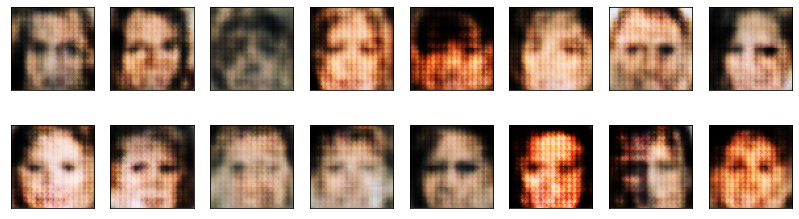

2023-12-05 04:33:02 | Ep [10/40] | Bch 0/254 | d_lss: -0.7929 | g_lss: 0.2861
2023-12-05 04:33:23 | Ep [10/40] | Bch 50/254 | d_lss: -0.7392 | g_lss: -0.1365
2023-12-05 04:33:44 | Ep [10/40] | Bch 100/254 | d_lss: -0.7319 | g_lss: 0.6872
2023-12-05 04:34:05 | Ep [10/40] | Bch 150/254 | d_lss: -0.6432 | g_lss: -0.2348
2023-12-05 04:34:23 | Ep [10/40] | Bch 200/254 | d_lss: -0.7636 | g_lss: -0.0629
2023-12-05 04:34:42 | Ep [10/40] | Bch 250/254 | d_lss: -0.7244 | g_lss: 0.0230


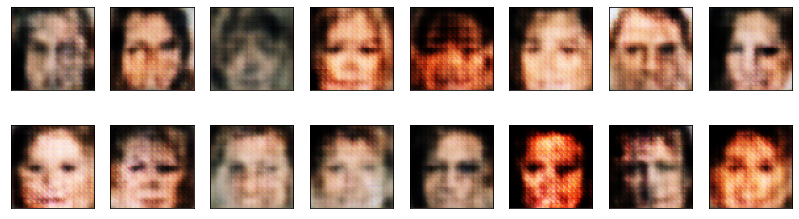

2023-12-05 04:34:47 | Ep [11/40] | Bch 0/254 | d_lss: -0.6306 | g_lss: -0.0013
2023-12-05 04:35:08 | Ep [11/40] | Bch 50/254 | d_lss: -0.6339 | g_lss: -0.6665
2023-12-05 04:35:29 | Ep [11/40] | Bch 100/254 | d_lss: -0.6996 | g_lss: -0.1833
2023-12-05 04:35:50 | Ep [11/40] | Bch 150/254 | d_lss: -0.6896 | g_lss: -0.1562
2023-12-05 04:36:11 | Ep [11/40] | Bch 200/254 | d_lss: -0.6369 | g_lss: -0.3483
2023-12-05 04:36:29 | Ep [11/40] | Bch 250/254 | d_lss: -0.6578 | g_lss: -0.0514


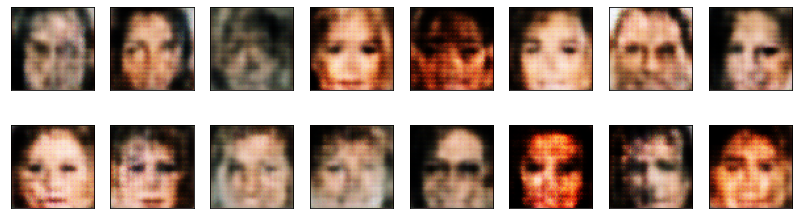

2023-12-05 04:36:35 | Ep [12/40] | Bch 0/254 | d_lss: -0.6194 | g_lss: -0.0939
2023-12-05 04:36:56 | Ep [12/40] | Bch 50/254 | d_lss: -0.6502 | g_lss: 0.1424
2023-12-05 04:37:17 | Ep [12/40] | Bch 100/254 | d_lss: -0.5469 | g_lss: -0.5522
2023-12-05 04:37:38 | Ep [12/40] | Bch 150/254 | d_lss: -0.7021 | g_lss: -0.2612
2023-12-05 04:37:59 | Ep [12/40] | Bch 200/254 | d_lss: -0.6534 | g_lss: -0.0535
2023-12-05 04:38:20 | Ep [12/40] | Bch 250/254 | d_lss: -0.6798 | g_lss: -0.0079


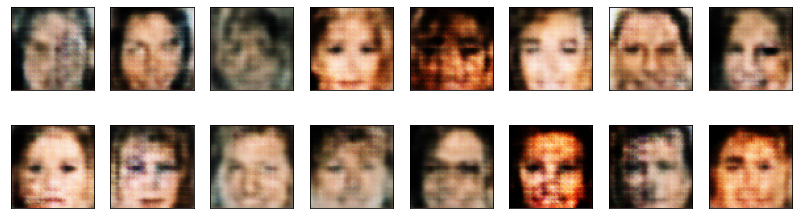

2023-12-05 04:38:25 | Ep [13/40] | Bch 0/254 | d_lss: -0.5927 | g_lss: -0.2060
2023-12-05 04:38:43 | Ep [13/40] | Bch 50/254 | d_lss: -0.6516 | g_lss: -0.3648
2023-12-05 04:39:03 | Ep [13/40] | Bch 100/254 | d_lss: -0.6559 | g_lss: -0.0000
2023-12-05 04:39:24 | Ep [13/40] | Bch 150/254 | d_lss: -0.6786 | g_lss: 0.0274
2023-12-05 04:39:45 | Ep [13/40] | Bch 200/254 | d_lss: -0.6824 | g_lss: -0.0893
2023-12-05 04:40:06 | Ep [13/40] | Bch 250/254 | d_lss: -0.6112 | g_lss: 0.1512


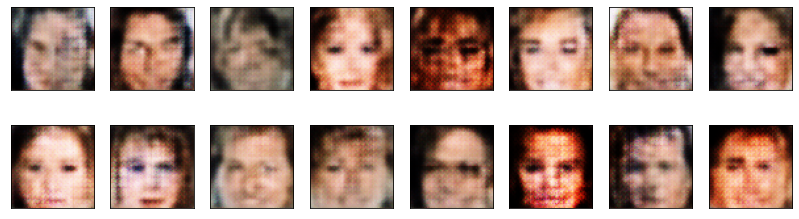

2023-12-05 04:40:12 | Ep [14/40] | Bch 0/254 | d_lss: -0.6412 | g_lss: -0.0699
2023-12-05 04:40:32 | Ep [14/40] | Bch 50/254 | d_lss: -0.6324 | g_lss: 0.0068
2023-12-05 04:40:50 | Ep [14/40] | Bch 100/254 | d_lss: -0.6377 | g_lss: -0.1422
2023-12-05 04:41:11 | Ep [14/40] | Bch 150/254 | d_lss: -0.5662 | g_lss: 0.0385
2023-12-05 04:41:32 | Ep [14/40] | Bch 200/254 | d_lss: -0.5958 | g_lss: 0.3824
2023-12-05 04:41:53 | Ep [14/40] | Bch 250/254 | d_lss: -0.6249 | g_lss: 0.0404


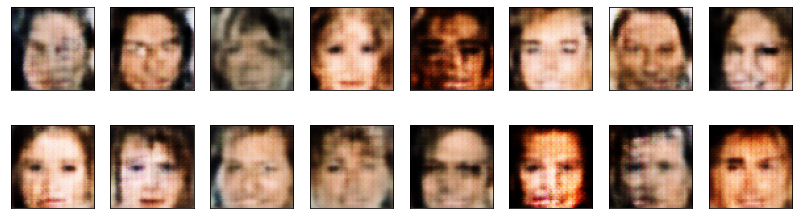

2023-12-05 04:41:59 | Ep [15/40] | Bch 0/254 | d_lss: -0.5796 | g_lss: 0.0240
2023-12-05 04:42:20 | Ep [15/40] | Bch 50/254 | d_lss: -0.6003 | g_lss: 0.1311
2023-12-05 04:42:40 | Ep [15/40] | Bch 100/254 | d_lss: -0.5489 | g_lss: -0.1182
2023-12-05 04:42:58 | Ep [15/40] | Bch 150/254 | d_lss: -0.6082 | g_lss: 0.0248
2023-12-05 04:43:18 | Ep [15/40] | Bch 200/254 | d_lss: -0.5493 | g_lss: -0.0876
2023-12-05 04:43:39 | Ep [15/40] | Bch 250/254 | d_lss: -0.5556 | g_lss: 0.1909


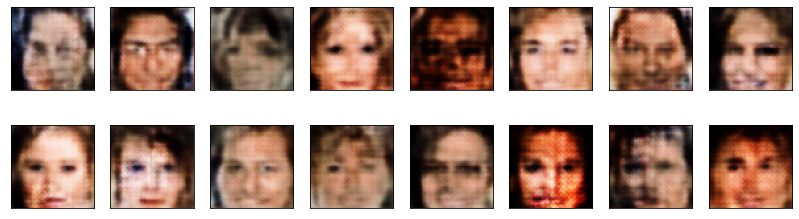

2023-12-05 04:43:45 | Ep [16/40] | Bch 0/254 | d_lss: -0.5136 | g_lss: -0.0176
2023-12-05 04:44:06 | Ep [16/40] | Bch 50/254 | d_lss: -0.5831 | g_lss: 0.1264
2023-12-05 04:44:28 | Ep [16/40] | Bch 100/254 | d_lss: -0.5725 | g_lss: 0.1804
2023-12-05 04:44:48 | Ep [16/40] | Bch 150/254 | d_lss: -0.5620 | g_lss: -0.0603
2023-12-05 04:45:06 | Ep [16/40] | Bch 200/254 | d_lss: -0.5573 | g_lss: 0.2067
2023-12-05 04:45:25 | Ep [16/40] | Bch 250/254 | d_lss: -0.5392 | g_lss: 0.0977


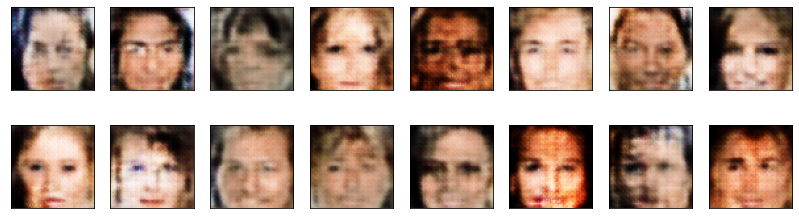

2023-12-05 04:45:30 | Ep [17/40] | Bch 0/254 | d_lss: -0.5316 | g_lss: 0.1273
2023-12-05 04:45:51 | Ep [17/40] | Bch 50/254 | d_lss: -0.5260 | g_lss: -0.1177
2023-12-05 04:46:12 | Ep [17/40] | Bch 100/254 | d_lss: -0.4931 | g_lss: -0.0733
2023-12-05 04:46:33 | Ep [17/40] | Bch 150/254 | d_lss: -0.4866 | g_lss: 0.0248
2023-12-05 04:46:54 | Ep [17/40] | Bch 200/254 | d_lss: -0.5372 | g_lss: -0.0611
2023-12-05 04:47:12 | Ep [17/40] | Bch 250/254 | d_lss: -0.5355 | g_lss: 0.1487


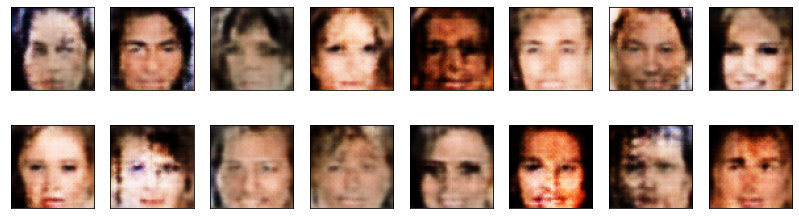

2023-12-05 04:47:17 | Ep [18/40] | Bch 0/254 | d_lss: -0.5188 | g_lss: 0.0626
2023-12-05 04:47:37 | Ep [18/40] | Bch 50/254 | d_lss: -0.4815 | g_lss: 0.0866
2023-12-05 04:47:59 | Ep [18/40] | Bch 100/254 | d_lss: -0.5259 | g_lss: 0.0219
2023-12-05 04:48:20 | Ep [18/40] | Bch 150/254 | d_lss: -0.5172 | g_lss: 0.0676
2023-12-05 04:48:41 | Ep [18/40] | Bch 200/254 | d_lss: -0.5000 | g_lss: 0.0240
2023-12-05 04:49:02 | Ep [18/40] | Bch 250/254 | d_lss: -0.4628 | g_lss: -0.0458


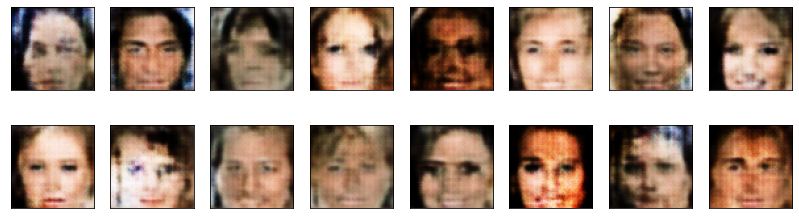

2023-12-05 04:49:07 | Ep [19/40] | Bch 0/254 | d_lss: -0.4974 | g_lss: 0.1977
2023-12-05 04:49:25 | Ep [19/40] | Bch 50/254 | d_lss: -0.4861 | g_lss: 0.0331
2023-12-05 04:49:45 | Ep [19/40] | Bch 100/254 | d_lss: -0.4877 | g_lss: 0.0890
2023-12-05 04:50:06 | Ep [19/40] | Bch 150/254 | d_lss: -0.4723 | g_lss: 0.1577
2023-12-05 04:50:27 | Ep [19/40] | Bch 200/254 | d_lss: -0.4703 | g_lss: 0.2399
2023-12-05 04:50:49 | Ep [19/40] | Bch 250/254 | d_lss: -0.4438 | g_lss: 0.4292


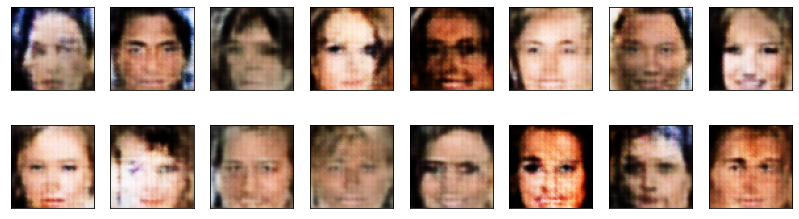

2023-12-05 04:50:54 | Ep [20/40] | Bch 0/254 | d_lss: -0.4356 | g_lss: 0.0772
2023-12-05 04:51:14 | Ep [20/40] | Bch 50/254 | d_lss: -0.4723 | g_lss: 0.1569
2023-12-05 04:51:32 | Ep [20/40] | Bch 100/254 | d_lss: -0.3987 | g_lss: -0.0894
2023-12-05 04:51:52 | Ep [20/40] | Bch 150/254 | d_lss: -0.4765 | g_lss: -0.1607
2023-12-05 04:52:13 | Ep [20/40] | Bch 200/254 | d_lss: -0.5014 | g_lss: -0.1164
2023-12-05 04:52:34 | Ep [20/40] | Bch 250/254 | d_lss: -0.4413 | g_lss: 0.0912


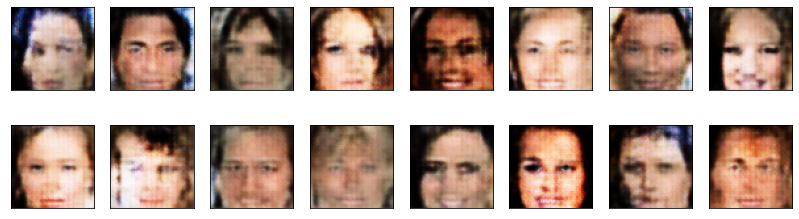

2023-12-05 04:52:39 | Ep [21/40] | Bch 0/254 | d_lss: -0.4269 | g_lss: 0.2950
2023-12-05 04:53:00 | Ep [21/40] | Bch 50/254 | d_lss: -0.4047 | g_lss: -0.1459
2023-12-05 04:53:21 | Ep [21/40] | Bch 100/254 | d_lss: -0.4028 | g_lss: -0.0798
2023-12-05 04:53:39 | Ep [21/40] | Bch 150/254 | d_lss: -0.4193 | g_lss: 0.0107
2023-12-05 04:53:58 | Ep [21/40] | Bch 200/254 | d_lss: -0.4075 | g_lss: -0.0395
2023-12-05 04:54:19 | Ep [21/40] | Bch 250/254 | d_lss: -0.4315 | g_lss: 0.2152


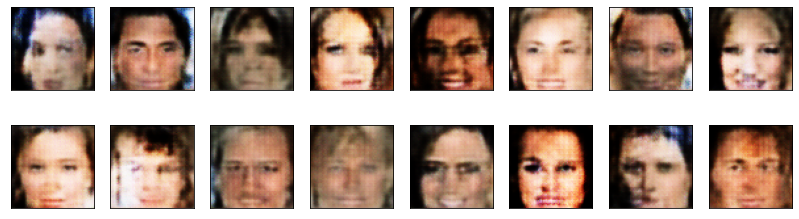

2023-12-05 04:54:24 | Ep [22/40] | Bch 0/254 | d_lss: -0.4217 | g_lss: 0.1831
2023-12-05 04:54:45 | Ep [22/40] | Bch 50/254 | d_lss: -0.3836 | g_lss: 0.0201
2023-12-05 04:55:07 | Ep [22/40] | Bch 100/254 | d_lss: -0.4339 | g_lss: 0.1142
2023-12-05 04:55:28 | Ep [22/40] | Bch 150/254 | d_lss: -0.3948 | g_lss: 0.1611
2023-12-05 04:55:45 | Ep [22/40] | Bch 200/254 | d_lss: -0.3585 | g_lss: 0.1356
2023-12-05 04:56:04 | Ep [22/40] | Bch 250/254 | d_lss: -0.4154 | g_lss: -0.1548


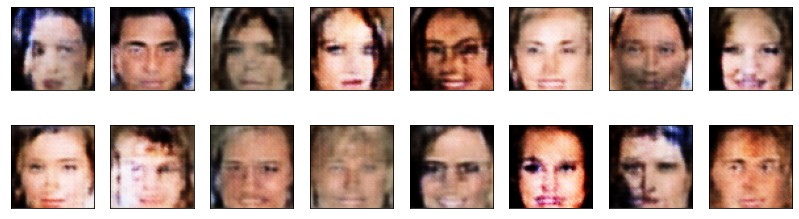

2023-12-05 04:56:10 | Ep [23/40] | Bch 0/254 | d_lss: -0.3988 | g_lss: 0.0071
2023-12-05 04:56:31 | Ep [23/40] | Bch 50/254 | d_lss: -0.3739 | g_lss: -0.0670
2023-12-05 04:56:52 | Ep [23/40] | Bch 100/254 | d_lss: -0.3923 | g_lss: -0.0924
2023-12-05 04:57:13 | Ep [23/40] | Bch 150/254 | d_lss: -0.3770 | g_lss: 0.1211
2023-12-05 04:57:34 | Ep [23/40] | Bch 200/254 | d_lss: -0.3916 | g_lss: 0.0562
2023-12-05 04:57:52 | Ep [23/40] | Bch 250/254 | d_lss: -0.3822 | g_lss: 0.1782


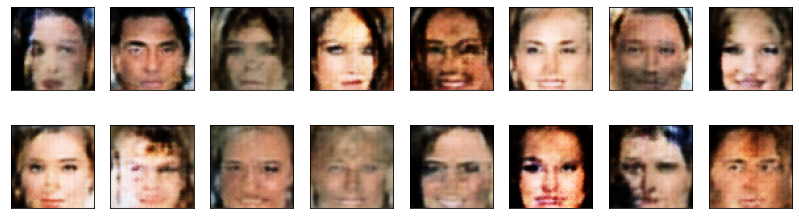

2023-12-05 04:57:57 | Ep [24/40] | Bch 0/254 | d_lss: -0.4212 | g_lss: 0.1383
2023-12-05 04:58:17 | Ep [24/40] | Bch 50/254 | d_lss: -0.3381 | g_lss: -0.2126
2023-12-05 04:58:38 | Ep [24/40] | Bch 100/254 | d_lss: -0.4147 | g_lss: -0.1484
2023-12-05 04:59:00 | Ep [24/40] | Bch 150/254 | d_lss: -0.3803 | g_lss: -0.0959
2023-12-05 04:59:20 | Ep [24/40] | Bch 200/254 | d_lss: -0.3177 | g_lss: 0.2755
2023-12-05 04:59:41 | Ep [24/40] | Bch 250/254 | d_lss: -0.3672 | g_lss: -0.0222


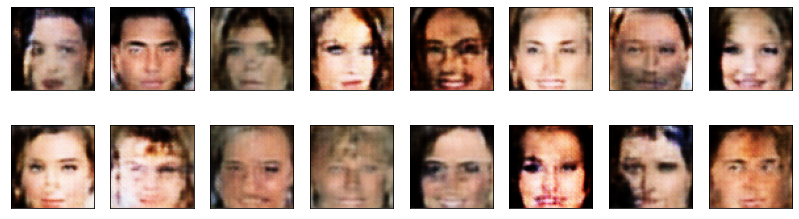

2023-12-05 04:59:47 | Ep [25/40] | Bch 0/254 | d_lss: -0.4064 | g_lss: -0.0066
2023-12-05 05:00:05 | Ep [25/40] | Bch 50/254 | d_lss: -0.3937 | g_lss: -0.0739
2023-12-05 05:00:25 | Ep [25/40] | Bch 100/254 | d_lss: -0.3875 | g_lss: 0.2516
2023-12-05 05:00:46 | Ep [25/40] | Bch 150/254 | d_lss: -0.3648 | g_lss: 0.2721
2023-12-05 05:01:07 | Ep [25/40] | Bch 200/254 | d_lss: -0.3894 | g_lss: 0.0859
2023-12-05 05:01:28 | Ep [25/40] | Bch 250/254 | d_lss: -0.3801 | g_lss: 0.0349


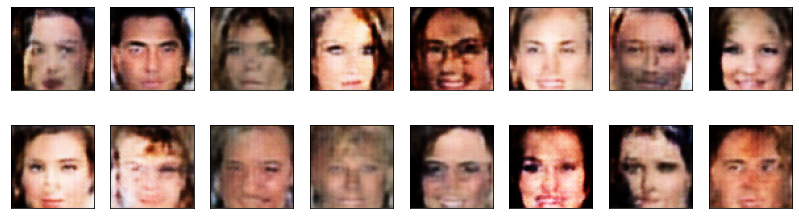

2023-12-05 05:01:34 | Ep [26/40] | Bch 0/254 | d_lss: -0.3297 | g_lss: -0.0696
2023-12-05 05:01:54 | Ep [26/40] | Bch 50/254 | d_lss: -0.3563 | g_lss: -0.2246
2023-12-05 05:02:12 | Ep [26/40] | Bch 100/254 | d_lss: -0.3438 | g_lss: 0.1371
2023-12-05 05:02:31 | Ep [26/40] | Bch 150/254 | d_lss: -0.3680 | g_lss: 0.0332
2023-12-05 05:02:52 | Ep [26/40] | Bch 200/254 | d_lss: -0.3854 | g_lss: 0.0360
2023-12-05 05:03:14 | Ep [26/40] | Bch 250/254 | d_lss: -0.3556 | g_lss: -0.0198


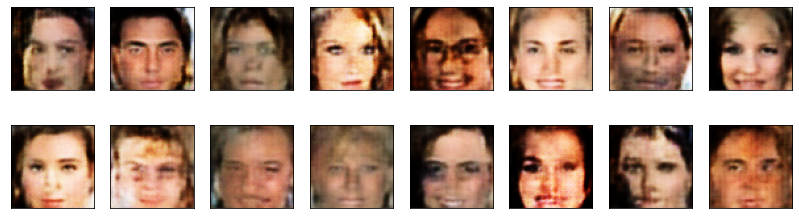

2023-12-05 05:03:19 | Ep [27/40] | Bch 0/254 | d_lss: -0.3777 | g_lss: 0.1752
2023-12-05 05:03:39 | Ep [27/40] | Bch 50/254 | d_lss: -0.3496 | g_lss: -0.2306
2023-12-05 05:04:01 | Ep [27/40] | Bch 100/254 | d_lss: -0.3331 | g_lss: -0.3317
2023-12-05 05:04:19 | Ep [27/40] | Bch 150/254 | d_lss: -0.3762 | g_lss: -0.0816
2023-12-05 05:04:38 | Ep [27/40] | Bch 200/254 | d_lss: -0.3830 | g_lss: -0.1322
2023-12-05 05:04:59 | Ep [27/40] | Bch 250/254 | d_lss: -0.3756 | g_lss: 0.1061


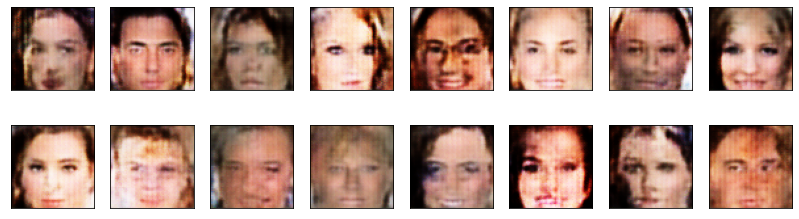

2023-12-05 05:05:04 | Ep [28/40] | Bch 0/254 | d_lss: -0.3416 | g_lss: 0.1244
2023-12-05 05:05:25 | Ep [28/40] | Bch 50/254 | d_lss: -0.3071 | g_lss: -0.4815
2023-12-05 05:05:47 | Ep [28/40] | Bch 100/254 | d_lss: -0.3662 | g_lss: 0.1098
2023-12-05 05:06:08 | Ep [28/40] | Bch 150/254 | d_lss: -0.3569 | g_lss: -0.0343
2023-12-05 05:06:26 | Ep [28/40] | Bch 200/254 | d_lss: -0.3644 | g_lss: 0.1109
2023-12-05 05:06:44 | Ep [28/40] | Bch 250/254 | d_lss: -0.3804 | g_lss: -0.1717


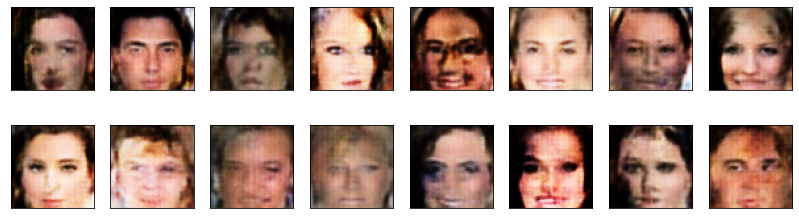

2023-12-05 05:06:51 | Ep [29/40] | Bch 0/254 | d_lss: -0.3751 | g_lss: 0.3345
2023-12-05 05:07:12 | Ep [29/40] | Bch 50/254 | d_lss: -0.3778 | g_lss: -0.0131
2023-12-05 05:07:33 | Ep [29/40] | Bch 100/254 | d_lss: -0.3211 | g_lss: 0.0505
2023-12-05 05:07:54 | Ep [29/40] | Bch 150/254 | d_lss: -0.3420 | g_lss: -0.0507
2023-12-05 05:08:15 | Ep [29/40] | Bch 200/254 | d_lss: -0.3095 | g_lss: -0.0234
2023-12-05 05:08:33 | Ep [29/40] | Bch 250/254 | d_lss: -0.3898 | g_lss: -0.0937


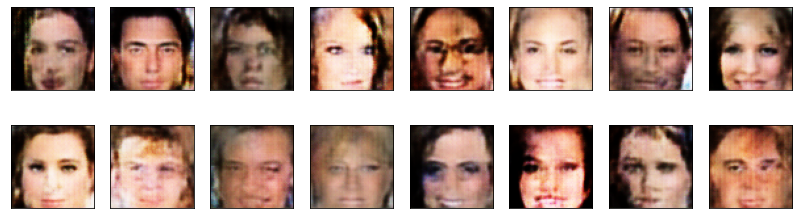

2023-12-05 05:08:39 | Ep [30/40] | Bch 0/254 | d_lss: -0.2182 | g_lss: 0.0447
2023-12-05 05:08:59 | Ep [30/40] | Bch 50/254 | d_lss: -0.3678 | g_lss: -0.1864
2023-12-05 05:09:20 | Ep [30/40] | Bch 100/254 | d_lss: -0.3619 | g_lss: 0.3175
2023-12-05 05:09:41 | Ep [30/40] | Bch 150/254 | d_lss: -0.3024 | g_lss: -0.1295
2023-12-05 05:10:02 | Ep [30/40] | Bch 200/254 | d_lss: -0.3397 | g_lss: -0.0596
2023-12-05 05:10:23 | Ep [30/40] | Bch 250/254 | d_lss: -0.3559 | g_lss: -0.3054


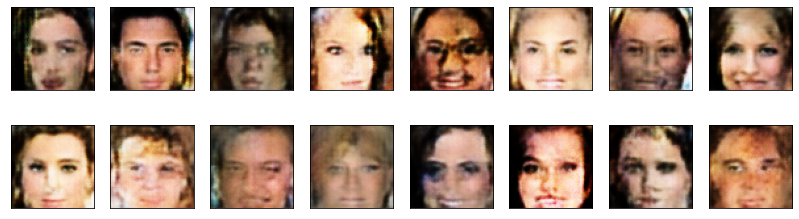

2023-12-05 05:10:28 | Ep [31/40] | Bch 0/254 | d_lss: -0.3299 | g_lss: 0.0389
2023-12-05 05:10:46 | Ep [31/40] | Bch 50/254 | d_lss: -0.3408 | g_lss: 0.0026
2023-12-05 05:11:05 | Ep [31/40] | Bch 100/254 | d_lss: -0.3182 | g_lss: 0.2257
2023-12-05 05:11:26 | Ep [31/40] | Bch 150/254 | d_lss: -0.3742 | g_lss: 0.0345
2023-12-05 05:11:48 | Ep [31/40] | Bch 200/254 | d_lss: -0.3524 | g_lss: -0.0536


KeyboardInterrupt: 

In [23]:
fixed_latent_vector = torch.randn(16, latent_dim, 1, 1).float().to(device)

losses = []
for epoch in range(n_epochs):
    for batch_i, real_images in enumerate(dataloader):
        
        ####################################
        # TODO: implement the training strategy
        # in WGAN, the discriminator is trained more frequently than generator 
        ####################################
        g_loss = generator_step(batch_size, latent_dim)
        
        real_images = real_images.to(device)
        d_loss = discriminator_step(batch_size, latent_dim, real_images)
        
        if batch_i % print_every == 0:
            # append discriminator loss and generator loss
            d = d_loss['loss'].item()
            g = g_loss['loss'].item()
            losses.append((d, g))
            # print discriminator and generator loss
            time = str(datetime.now()).split('.')[0]
            print(f'{time} | Ep [{epoch+1}/{n_epochs}] | Bch {batch_i}/{len(dataloader)} | d_lss: {d:.4f} | g_lss: {g:.4f}')
    
    # display images during training
    generator.eval()
    generated_images = generator(fixed_latent_vector)
    display(generated_images)
    generator.train()

In [ ]:
#STOP

fruit = ['apple', 'banana', 'orange', 'd','e','f','g']

for epoch in range(3):
    for batch_i, real_images in enumerate(dataloader):   
        if (epoch<=1) or ((epoch>1) and (batch_i % 4 == 0)):
            g = batch_i
        d = batch_i
        
        # print discriminator and generator loss
        print(f'Ep [{epoch+1}/{3}] | Bch {batch_i}/{len(dataloader)} | d: {d} | g: {g}')
    

In [24]:
torch.save(generator.state_dict(), 'generator6.pth')
torch.save(discriminator.state_dict(), 'discriminator6.pth')

### Training losses

Plot the training losses for the generator and discriminator.

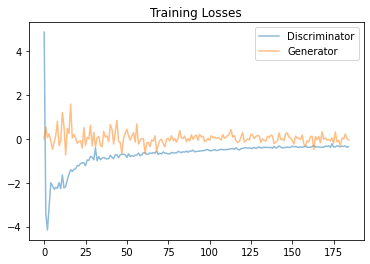

In [25]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""
fig, ax = plt.subplots()
losses = np.array(losses)
plt.plot(losses.T[0], label='Discriminator', alpha=0.5)
plt.plot(losses.T[1], label='Generator', alpha=0.5)
plt.title("Training Losses")
plt.legend()

### Question: What do you notice about your generated samples and how might you improve this model?
When you answer this question, consider the following factors:
* The dataset is biased; it is made of "celebrity" faces that are mostly white
* Model size; larger models have the opportunity to learn more features in a data feature space
* Optimization strategy; optimizers and number of epochs affect your final result
* Loss functions

**Answer:** (Write your answer in this cell)

### Submitting This Project
When submitting this project, make sure to run all the cells before saving the notebook. Save the notebook file as "dlnd_face_generation.ipynb".  

Submit the notebook using the ***SUBMIT*** button in the bottom right corner of the Project Workspace.